In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from networkx.algorithms import approximation
import random
from collections import Counter
import community as community_louvain


In [3]:
nodes = pd.read_csv("./nature_research/cociteNodes.csv", usecols=["size", "PubYear", "HierCat", "NatureID", "Title"])
edges = pd.read_csv("./nature_research/cociteEdges.csv", usecols=["source", "target"])

In [4]:
G = nx.Graph()  # Use nx.DiGraph() for directed graphs

# Add nodes with attributes
for _, row in nodes.iterrows():
    G.add_node(row['NatureID'])

# Add edges with attributes
for _, row in edges.iterrows():
    G.add_edge(row['source'], row['target'])

subgraphs = [G.subgraph(component).copy() for component in nx.connected_components(G)]

In [7]:
components = list(nx.connected_components(G))

subgraphs = [G.subgraph(component).copy() for component in nx.connected_components(G)]
G2 = subgraphs[0]

In [6]:
adj_matrix = nx.to_numpy_array(G)  # or nx.to_numpy_array(G)
print("ok")
# Compute degrees
degrees = dict(G.degree())
print("ok")
# Sort nodes by degree (descending)
sorted_nodes = sorted(degrees, key=degrees.get, reverse=True)
print("ok")
# Create a mapping of nodes to their sorted indices
node_order = {node: i for i, node in enumerate(sorted_nodes)}
print("ok")
# Permute adjacency matrix rows and columns based on the sort order
sorted_adj_matrix = adj_matrix[np.ix_([node_order[node] for node in sorted_nodes],[node_order[node] for node in sorted_nodes])]

: 

In [ ]:
# Plot the BOSAM
plt.figure(figsize=(8, 8))
plt.imshow(sorted_adj_matrix, cmap='binary', interpolation='none')
plt.title("Bitmap of Sorted Adjacency Matrix (BOSAM)")
plt.xlabel("Nodes (sorted by degree)")
plt.ylabel("Nodes (sorted by degree)")
plt.show()

In [5]:
print(f"Nodes: {G.number_of_nodes()}, Edges: {G.number_of_edges()}")


Nodes: 88231, Edges: 239621


In [9]:
# Compute degree of all nodes
degree_dict = dict(G2.degree())

# Sort nodes by degree (descending order)
sorted_nodes = sorted(degree_dict.items(), key=lambda x: x[1], reverse=True)
top_hub_nodes = [node for node, degree in sorted_nodes[:11]]  # Top 10 hubs

print("Top Hub Nodes:", top_hub_nodes)

# Remove hubs and compute the new diameter
G_without_hubs = G2.copy()
G_without_hubs.remove_nodes_from(top_hub_nodes)

if nx.is_connected(G_without_hubs):
    new_diameter = nx.approximation.diameter(G_without_hubs)
    print(f"New Diameter After Removing Hubs: {new_diameter}")
else:
    print("Graph becomes disconnected after removing hubs.")

Top Hub Nodes: ['158197a0', '143516b0', '136220a0', '135147a0', '133721b0', '136065b0', '161520a0', '138723a0', '185325a0', '130846a0', '133564b0']
New Diameter After Removing Hubs: 49


In [10]:
most_frequent_node = edges["target"].mode()[0]
most_frequent_node_2 = edges["source"].mode()[0]
combined = pd.concat([edges["target"], edges["source"]])
most_frequent = combined.mode()[0]
print(most_frequent_node, most_frequent_node_2, most_frequent)
count_combined = combined.value_counts().get(most_frequent, 0)
print(count_combined)

136220a0 161520a0 158197a0
91


In [13]:
# Find duplicate titles
duplicates = nodes[nodes.duplicated(subset='Title', keep=False)]

# Display duplicate rows
print(duplicates)

# Group duplicates by title
grouped_duplicates = duplicates.groupby('Title')

# Display grouped duplicates
for title, group in grouped_duplicates:
    print(f"Title: {title}")
    print(group)
    print("\n")

       size  PubYear  HierCat      NatureID  \
0       5.3     1900        1      062366b0   
3       4.6     1900       10      062149b0   
15      4.0     1902       13      066055a0   
16      5.3     1902        2      066630e0   
18      5.3     1902        6      066577b0   
...     ...      ...      ...           ...   
85567   5.3     2012        2  nature10829a   
85568   5.3     2012        2  nature10829b   
85569   5.3     2012        2   nature10829   
85845  19.6     2012        4   nature10867   
85846  19.6     2012        4   nature10867   

                                                   Title  
0                                Atmospheric Electricity  
3                                Atmospheric Electricity  
15     On Prof. Arrhenius' Theory of Cometary Tails a...  
16                         Bipedal Locomotion in Lizards  
18                         Bipedal Locomotion in Lizards  
...                                                  ...  
85567  Structural basi

In [15]:
number_publication_per_year = []
for year in range(1900, 2017):
    count = nodes["PubYear"].value_counts().get(year, 0)
    number_publication_per_year.append(count)
print(number_publication_per_year)

[5, 8, 13, 22, 13, 8, 10, 15, 12, 7, 7, 4, 6, 30, 14, 13, 4, 5, 3, 4, 22, 26, 48, 63, 62, 89, 84, 104, 94, 146, 142, 130, 150, 206, 249, 312, 141, 156, 380, 340, 239, 168, 182, 224, 330, 364, 589, 639, 758, 798, 861, 847, 833, 897, 761, 838, 1052, 1059, 1735, 1893, 2041, 2320, 2386, 2587, 2568, 2425, 2620, 2518, 1991, 1898, 1784, 1084, 791, 978, 1598, 1580, 1544, 1501, 1454, 1301, 1301, 1206, 1149, 1095, 1103, 1091, 1152, 1129, 1109, 1005, 1101, 998, 999, 958, 871, 913, 891, 903, 889, 881, 889, 841, 794, 770, 718, 823, 786, 673, 747, 703, 725, 724, 727, 709, 668, 658, 400]


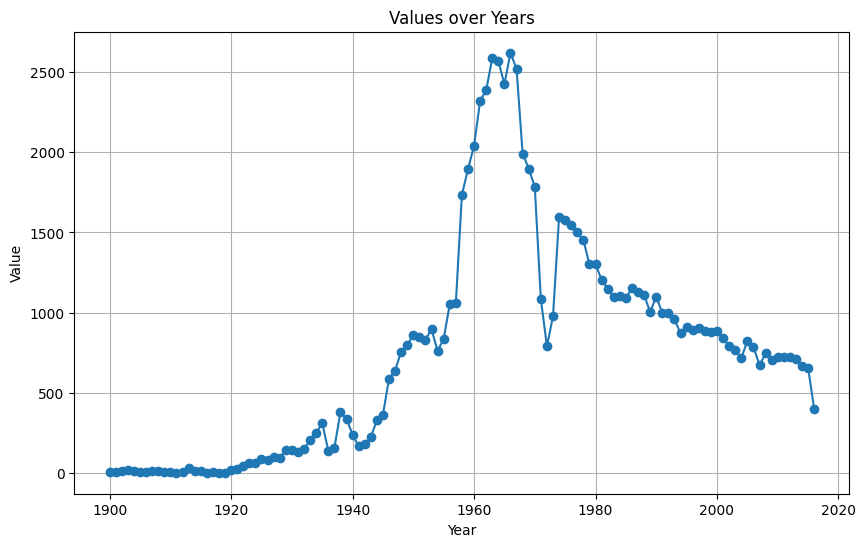

In [16]:
# Create the scale (x-axis)
years = [1900 + i for i in range(len(number_publication_per_year))]

# Plot the values
plt.figure(figsize=(10, 6))  # Set figure size
plt.plot(years, number_publication_per_year, marker='o')  # Line plot with markers

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Value")
plt.title("Values over Years")

# Display the plot
plt.grid()  # Optional: Add grid lines
plt.show()

In [18]:
# Compute value counts once
value_counts = combined.value_counts()

# Map counts to 'NatureID', defaulting to 0 for IDs not in 'combined'
nodes['CoCitationNumbers'] = nodes['NatureID'].map(value_counts).fillna(0).astype(int)

print(nodes)

       size  PubYear  HierCat     NatureID  \
0       5.3     1900        1     062366b0   
1       4.6     1900       10     062340b0   
2       7.9     1900        1     062620e0   
3       4.6     1900       10     062149b0   
4       4.0     1900        4     062523e0   
...     ...      ...      ...          ...   
88277   4.0     2016        2  nature18610   
88278   4.6     2016        4  nature16527   
88279   5.3     2016        1  nature19073   
88280   5.3     2016        6  nature17189   
88281   4.6     2016        2  nature17449   

                                                   Title  CoCitationNumbers  
0                                Atmospheric Electricity                  3  
1      The Conductivity produced in Gases by the Moti...                  2  
2                         Albinism and Natural Selection                  7  
3                                Atmospheric Electricity                  2  
4                            Leaf Decay and Autumn Tints 

In [19]:
total_co_citations_number_per_year = []
mean_co_citations_number_per_year = []

for year in range(1900, 2017):
    filtered_rows = nodes[nodes['PubYear'] == year]
    # Calculate the sum and average of the 'value' column for the filtered rows
    sum_value = filtered_rows['CoCitationNumbers'].sum()
    avg_value = filtered_rows['CoCitationNumbers'].mean()
    total_co_citations_number_per_year.append(sum_value)
    mean_co_citations_number_per_year.append(avg_value)


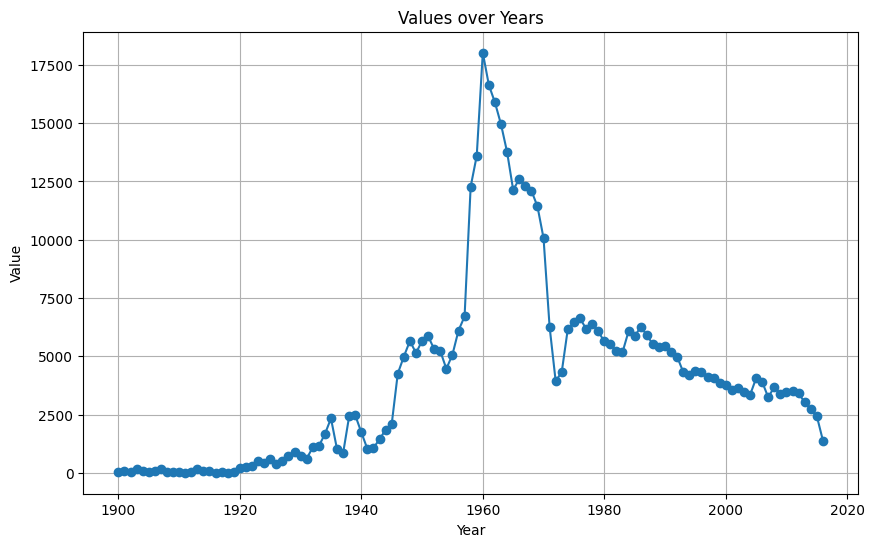

In [20]:
# Plot the values
plt.figure(figsize=(10, 6))  # Set figure size
plt.plot(years, total_co_citations_number_per_year, marker='o')  # Line plot with markers

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Value")
plt.title("Values over Years")

# Display the plot
plt.grid()  # Optional: Add grid lines
plt.show()

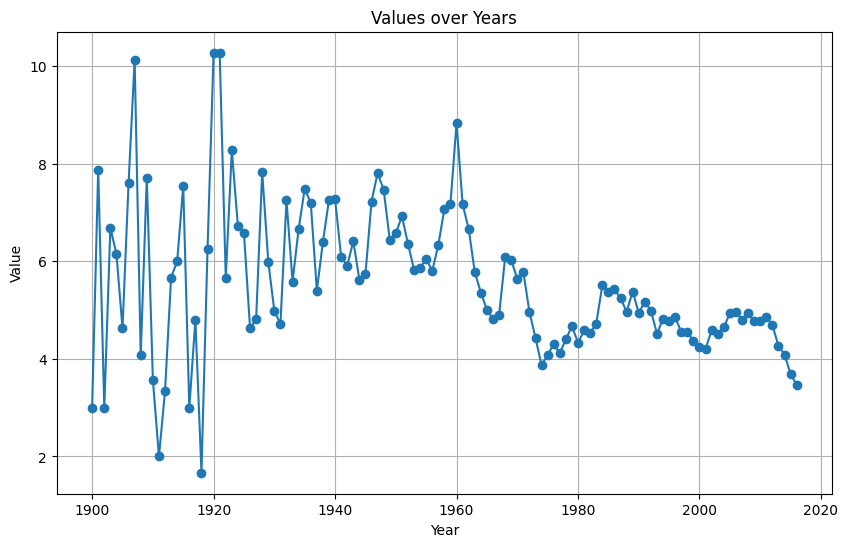

In [21]:
# Plot the values
plt.figure(figsize=(10, 6))  # Set figure size
plt.plot(years, mean_co_citations_number_per_year, marker='o')  # Line plot with markers

# Add labels and title
plt.xlabel("Year")
plt.ylabel("Value")
plt.title("Values over Years")

# Display the plot
plt.grid()  # Optional: Add grid lines
plt.show()

In [23]:
import community as community_louvain  # Install with: pip install python-louvain

# Partition the graph using the Louvain method
partition = community_louvain.best_partition(G2)

# Compute modularity
modularity = community_louvain.modularity(partition, G2)
print(f"Modularity: {modularity}")

Modularity: 0.906236155893734


In [24]:
betweenness_centrality = nx.betweenness_centrality(G)

# Example: Print top 5 nodes with the highest betweenness centrality
top_betweenness = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)[:5]
print("Top nodes by Betweenness Centrality:")
for node, centrality in top_betweenness:
    print(f"Node: {node}, Centrality: {centrality}")

KeyboardInterrupt: 

In [ ]:
# Compute the average path length
average_path_length = nx.average_shortest_path_length(G)
print(f"Average Path Length: {average_path_length}")

In [130]:
# Create a mapping from NodeID to Title
id_to_title = dict(zip(nodes['NatureID'], nodes['Title']))

subgraphs = [G.subgraph(component).copy() for component in nx.connected_components(G)]
G2 = subgraphs[0]
titles = []

if G2.number_of_edges() > 0:
    # Perform community detection
    partition = community_louvain.best_partition(G2)
    num_communities = len(set(partition.values()))
    modularity = community_louvain.modularity(partition, G2)

    print(num_communities)

    # Group nodes by community
    communities = {}
    for node, community in partition.items():
        communities.setdefault(community, []).append(node)

    # Print communities with titles instead of NatureID
    for community, node_ids in communities.items():
        title = [id_to_title[node] for node in node_ids if node in id_to_title]  # Replace NodeID with Title
        titles.append(title)
        print(f"Community {community}: {title}")
    print("\n")
else:
    modularity = 'N/A'
    num_communities = 0
    print("No communities found.\n")


132
Community 74: ['Atmospheric Electricity', 'The Conductivity produced in Gases by the Motion of Negatively-charged Ions', 'Atmospheric Electricity', 'Vortex Rings', 'Atmospheric Electricity', 'The Electrification of Insulating Materials', 'Rainless Thunderstorms', 'A Photographic Study of Vortex Rings in Liquids', 'The Bursting of Bubbles', 'Waterspouts', 'Thunderstorms and Globular Lightning', 'Snow and the Survival of Cod Fry', 'The Electrical Charges from Like Solids', 'River Pollution and the Acidity of Natural Waters', 'The Instability of a Single Vortex-Row', 'Lightning1', 'Motion of an Electric Arc in a Magnetic Field under Low Gas Pressure', 'Liquid Drops on the Same Liquid Surface', 'Ozone in the Upper Atmosphere and its Relation to Meteorology', 'Similarity between Cosmic Rays and Gamma Rays', 'Rotation of ‘Dust Devils&#34;', 'Branching of Lightning', 'Structure and Development of Temperature Inversions in the Atmosphere', 'Ionisation at High Gas Pressures', 'Development o

In [138]:
print(len(titles[1]))

1674


In [139]:
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Example list of titles
# titles = ["title1", "title2", ...]

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(titles[1])

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Compute average similarity for each title
average_similarities = similarity_matrix.mean(axis=1)

# Get indices of the 10 least similar titles
least_similar_indices = np.argsort(average_similarities)[:200]

# Remove the 10 least similar titles
filtered_indices = [i for i in range(len(titles[1])) if i not in least_similar_indices]
filtered_titles = [titles[1][i] for i in filtered_indices]
filtered_embeddings = embeddings[filtered_indices]

# Recompute the similarity matrix for the filtered titles
filtered_similarity_matrix = cosine_similarity(filtered_embeddings)

# Compute the average coherence score
num_filtered = len(filtered_titles)
upper_triangle = np.triu_indices(num_filtered, k=1)
average_coherence_score = filtered_similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score (Filtered): {average_coherence_score:.4f}")


Average Coherence Score (Filtered): 0.1985


In [137]:
# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(titles[1])

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(titles[1])
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[ 0.9999999   0.09084974  0.06863552 ...  0.06147643  0.14850496
   0.21918705]
 [ 0.09084974  1.          0.37790552 ...  0.05442723  0.17380705
   0.05751505]
 [ 0.06863552  0.37790552  1.0000002  ...  0.01028135  0.1703184
   0.00551847]
 ...
 [ 0.06147643  0.05442723  0.01028135 ...  1.0000004   0.5669757
  -0.07149956]
 [ 0.14850496  0.17380705  0.1703184  ...  0.5669757   0.99999994
  -0.02243976]
 [ 0.21918705  0.05751505  0.00551847 ... -0.07149956 -0.02243976
   1.0000001 ]]
Average Coherence Score: 0.1649


In [68]:
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

# Assuming `communities` is a dictionary where each value is a list of titles
# Example structure: communities = {0: ["Title 1", "Title 2"], 1: ["Title A", "Title B"], ...}
#new_communities = list(communities.values())  # Replace with your actual data

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Store coherence scores for each list
coherence_scores = []

# Iterate over each community (list of titles)
for title in titles:
    if len(title) > 1:  # Ensure there are at least 2 titles to compare
        # Generate embeddings for titles
        embeddings = model.encode(title)

        # Compute cosine similarity matrix
        similarity_matrix = cosine_similarity(embeddings)

        # Extract upper triangular values (excluding diagonal)
        num_titles = len(title)
        upper_triangle = np.triu_indices(num_titles, k=1)

        # Compute average pairwise similarity for this community
        average_similarity = similarity_matrix[upper_triangle].mean()
        coherence_scores.append(average_similarity)
    else:
        # If a community has 1 or no titles, skip it
        coherence_scores.append(None)

# Filter out None values (empty or single-title communities)
coherence_scores = [score for score in coherence_scores if score is not None]

# Compute overall average and standard deviation
overall_average = np.mean(coherence_scores)
overall_std_dev = np.std(coherence_scores)

# Compute highest and lowest coherence scores
highest_coherence = np.max(coherence_scores)
lowest_coherence = np.min(coherence_scores)

# Display the results
print(f"Average Coherence Across Communities: {overall_average:.4f}")
print(f"Standard Deviation of Coherence Scores: {overall_std_dev:.4f}")
print(f"Highest Coherence Score: {highest_coherence:.4f}")
print(f"Lowest Coherence Score: {lowest_coherence:.4f}")



Average Coherence Across Communities: 0.1822
Standard Deviation of Coherence Scores: 0.0527
Highest Coherence Score: 0.3438
Lowest Coherence Score: 0.0643


In [53]:
# Example: Original graph
original_graph = G2  # Replace with your actual graph

# a) Random Rewiring
rewired_graph = nx.double_edge_swap(original_graph.copy(), nswap=100, max_tries=1000)

# b) Degree-Preserving Randomization
degree_sequence = [d for n, d in original_graph.degree()]
degree_preserved_graph = nx.configuration_model(degree_sequence)
degree_preserved_graph = nx.Graph(degree_preserved_graph)  # Remove parallel edges and self-loops
degree_preserved_graph.remove_edges_from(nx.selfloop_edges(degree_preserved_graph))

# c) Erdős-Rényi Random Graph
num_nodes = original_graph.number_of_nodes()
num_edges = original_graph.number_of_edges()
random_graph = nx.gnm_random_graph(num_nodes, num_edges)

In [54]:
if rewired_graph.number_of_edges() > 0:
    # Perform community detection
    partition = community_louvain.best_partition(rewired_graph)
    num_communities = len(set(partition.values()))
    modularity = community_louvain.modularity(partition, rewired_graph)

    print(num_communities)

    # Group nodes by community
    communities = {}
    for node, community in partition.items():
        communities.setdefault(community, []).append(node)

    # Print communities with titles instead of NatureID
    for community, node_ids in communities.items():
        titles = [id_to_title[node] for node in node_ids if node in id_to_title]  # Replace NodeID with Title
        print(f"Community {community}: {titles}")
    print("\n")
else:
    modularity = 'N/A'
    num_communities = 0
    print("No communities found.\n")

134
Community 0: ['Atmospheric Electricity', 'The Conductivity produced in Gases by the Motion of Negatively-charged Ions', 'Atmospheric Electricity', 'Atmospheric Electricity', 'The Electrification of Insulating Materials', 'Rainless Thunderstorms', 'Experiments with Kathode Rays', 'The Bursting of Bubbles', 'Colour Temperature and Brightness of Moonlight', 'Hafnium and Titanium', 'Luminescence of Solid Nitrogen and the Auroral Spectrum', 'Transformations of Elements', 'Mercury and Helium', 'On the Luminescence of Solid Nitrogen and Argon', 'Mercury Helide', 'Mercury Helide: a Correction', 'Preliminary Note on the Transmutation of Mercury into Gold', 'The Transmutation of Elements', 'Transmutation of Elements', 'Mercury Helides', 'The Electrical Charges from Like Solids', 'Helium Compound', 'The Origin of the Nebulium Spectrum', 'The Origin of the Nebulium Spectrum', 'The Origin of the Nebulium Spectrum', 'Motion of an Electric Arc in a Magnetic Field under Low Gas Pressure', 'Fluores

In [55]:
communities_rewiered = list(communities.values())  # Replace with your actual data

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Store coherence scores for each list
coherence_scores = []

# Iterate over each community (list of titles)
for titles in communities_rewiered:
    if len(titles) > 1:  # Ensure there are at least 2 titles to compare
        # Generate embeddings for titles
        embeddings = model.encode(titles)

        # Compute cosine similarity matrix
        similarity_matrix = cosine_similarity(embeddings)

        # Extract upper triangular values (excluding diagonal)
        num_titles = len(titles)
        upper_triangle = np.triu_indices(num_titles, k=1)

        # Compute average pairwise similarity for this community
        average_similarity = similarity_matrix[upper_triangle].mean()
        coherence_scores.append(average_similarity)
    else:
        # If a community has 1 or no titles, skip it
        coherence_scores.append(None)

# Filter out None values (empty or single-title communities)
coherence_scores = [score for score in coherence_scores if score is not None]

# Compute overall average and standard deviation
overall_average = np.mean(coherence_scores)
overall_std_dev = np.std(coherence_scores)

print(f"Average Coherence Across Communities: {overall_average:.4f}")
print(f"Standard Deviation of Coherence Scores: {overall_std_dev:.4f}")

Average Coherence Across Communities: 0.6152
Standard Deviation of Coherence Scores: 0.0386


In [ ]:
if random_graph.number_of_edges() > 0:
    # Perform community detection
    partition = community_louvain.best_partition(random_graph)
    num_communities = len(set(partition.values()))
    modularity = community_louvain.modularity(partition, random_graph)

    print(num_communities)

    # Group nodes by community
    communities = {}
    for node, community in partition.items():
        communities.setdefault(community, []).append(node)

    # Print communities with titles instead of NatureID
    for community, node_ids in communities.items():
        titles = [id_to_title[node] for node in node_ids if node in id_to_title]  # Replace NodeID with Title
        print(f"Community {community}: {titles}")
    print("\n")
else:
    modularity = 'N/A'
    num_communities = 0
    print("No communities found.\n")

In [85]:
abstracts = ["FROM the letter signed “E. G.” in your issue of August 31, it would appear that the Meteorological Office has not abandoned the ion condensation theory of the origin of atmospheric electricity. Now, there are many difficulties in accepting that theory. For instance, before condensation can take place on ions, there must first be dustless air; otherwise the necessary supersaturation cannot take place; and one naturally asks, Has anyone ever found dustless air in our atmosphere? So far as records go of air up to 10,000 feet, this has not yet been found, and it does not seem likely that it ever will be found, as the hot air carrying up the aqueous vapour to form clouds always carries up with it plenty of dust to act, if one may use the simile, as the return ticket to bring the water back to the surface of the earth. As much of this dust is very fine, only falling a few centimetres in a day at low level, it is likely to go wherever the moist air goes—in even the more rarefied regions of the upper clouds. Further, there is the constant supply of fine dust from the upper regions due to the disintegration of meteors, so that the air at cloud levels is likely always to have plenty of dust and condensation on ions seems impossible.", "SOME time ago, while endeavouring to get a trustworthy method of producing static charges in a humid atmosphere, I had occasion to experiment with celluloid. Rolled celluloid sheet with the surface burnished was found very suitable. If a “tassel” be made of this material by cutting up a small piece of thin sheet into narrow strips, then by simply placing the “tassel” on a table and stroking with the fingers, strong electrification is produced. On raising the “tassel” the strips diverge, and remain divergent in a most striking manner.", "PRESUMABLY all bubbles when they burst on the surface of a liquid commence to do so at the top and thus give rise to gaseous vortices. In the ordinary way these are not apparent, but recently we have accidentally discovered a neat way of making them easily visible. The method consists in creating the bubbles by sparking with a Ruhmkorff coil between two wires beneath the surface of some resin oil and thus gasifying the latter. As the bubbles are full of smoke, when they burst the vortex effect is clearly indicated by the formation of beautiful little smoke rings. The size of the bubbles and of the rings depends upon the viscosity of the oil, greater viscosity causing bubbles and rings to become larger. This can easily be shown by cooling or warming the oil.", "IT has been a favourite idea with marine biologists in recent years that a connexion exists between the amount and timely efflorescence of plankton algæ and the success of propagation of certain sea fishes, the fry of which are directly or indirectly dependent upon the plankton algæ for their food. The correctness of this view has been demonstrated at least as regards the mackerel on the south coast of England by Prof. E. J. Allen, who traces the ultimate cause of the algal growth back to more or less abundant sunshine in the first months of the year. Prof. Gran has also shown that another influence must be at work to produce conditions more or less suitable for the development of plankton algæ, namely, the more or less plentiful amount of fresh water flowing into the sea and carrying with it from the land the salts and other substances necessary for plant life in the sea.", "THE uncertainty as to the charges arising on insulating solids when rubbed together has ever provided perplexities for the investigator and pitfalls for the lecturer. I have shown in previous papers (Proc. Phys. Soc., 1915, and Proc. Roy. Soc., 1917 and 1926) that a clean solid, say glass, may have entirely different qualities according to the previous treatment of the surface. Ordinary dirt, adsorbed films, temperature change, and, in particular, strain left on the surface by the rough pressure of other solids, are variables which vitally influence surface electrification.", "IN a letter on this subject in NATURE of March 29, Mr. Aitken criticises the theory which attributes the prevalence of positive electrification in the atmosphere to the superiority in efficiency as nuclei for the condensation of water vapour, of the negative ions over the positive.", "IN two previous papers,1 I have mentioned that water at ordinary temperature is not a suitable liquid for forming “liquid drops floating on the same liquid surface”. In August 1930, however, I observed at Den Kund (Dalhousie hills), at a height of about 1000 ft. above the sea-level, that water is quite a suitable liquid for easy formation of either primary2 or secondary drops. The life of these drops is also found to be longer. The splashing gives easy formation of secondary drops of quite a long life. The temperature of the water was about 34° F. The surface tension of water at this temperature is 76.53 dynes per cm., and viscosity 0.0179 c.g.s. units.", "IN the Journalde Physique et le Radium for April 1928, Prof. N. Minorsky describes observations he has made on the behaviour of a mercury arc in a magnetic field under low gas pressure. Under certain experimental conditions he found that the arc moved in a direction opposite to that which should be expected from the electrodynamical laws governing the movement of a conductor carrying current in a magnetic field, and proposes a space charge theory to explain this phenomenon. His theory is based upon the assumption that by the combined effects of collisions and the magnetic field, the electrons in the arc-stream are made to travel in the electrodynamic sense around the annular space in which his arc is drawn, and will thereby establish a negative space charge on the opposite side of the arc. The action of this space charge on the positive ions of the arc is assumed to cause the arc to move in the direction observed. It will be realised that this theory requires a circular or at least a closed path for the arc to move along.", "WHEN we review the history of our knowledge of atmospheric electricity, we find that it can be divided into three well-marked periods.", "IN “Fundamental Problems relating to River Pollution” (NATURE, Mar. 26, p. 463), Mr. H. W. Harvey mentions the probable effect of the hydrogen ion concentration on river flora and fauna, and suggests that possibly pH 5.5 is a critical value"]

In [86]:
# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(abstracts)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(abstracts)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[ 1.0000004   0.2728016   0.15467554  0.0987706   0.2079829   0.48500925
   0.26222953  0.21779403  0.45652273  0.14875375]
 [ 0.2728016   1.0000002   0.1176392   0.12890574  0.49411118  0.31684077
   0.19317621  0.2580483   0.32232937  0.05229946]
 [ 0.15467554  0.1176392   1.0000002   0.07597298  0.07507122  0.09153355
   0.22755589  0.18456253  0.06635249  0.01045776]
 [ 0.0987706   0.12890574  0.07597298  0.9999997  -0.00864352  0.18180895
   0.27907702  0.0436266   0.12641859  0.34138733]
 [ 0.2079829   0.49411118  0.07507122 -0.00864352  1.0000001   0.3220635
   0.14924338  0.28323066  0.27463058  0.04975928]
 [ 0.48500925  0.31684077  0.09153355  0.18180895  0.3220635   1.0000001
   0.16532654  0.41567606  0.43204486  0.2245188 ]
 [ 0.26222953  0.19317621  0.22755589  0.27907702  0.14924338  0.16532654
   0.99999994  0.06129256  0.00909206  0.17396507]
 [ 0.21779403  0.2580483   0.18456253  0.0436266   0.28323066  0.41567606
   0.06129256  1.0000004 

In [83]:
new_titles = ["The Electrification of Insulating Materials", "Rainless Thunderstorms", 'The Bursting of Bubbles', 'Snow and the Survival of Cod Fry', 'The Electrical Charges from Like Solids', 'Atmospheric Electricity', 'River Pollution and the Acidity of Natural Waters', 'Lightning1', 'Motion of an Electric Arc in a Magnetic Field under Low Gas Pressure', 'Liquid Drops on the Same Liquid Surface' ]

In [84]:
# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(new_titles)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(new_titles)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[ 1.00000012e+00  1.10681877e-01  1.43818274e-01  7.66363344e-04
   5.86393476e-01  4.49756742e-01  6.67219386e-02  9.04476196e-02
   5.64033650e-02  6.93592280e-02]
 [ 1.10681877e-01  1.00000000e+00  1.45905137e-01  2.37172663e-01
   1.11866377e-01  3.49424481e-01  2.11193282e-02  4.17285442e-01
   1.23418078e-01  1.23905435e-01]
 [ 1.43818274e-01  1.45905137e-01  1.00000000e+00  1.24570459e-01
   2.28906214e-01  1.63087994e-01  9.24196690e-02  1.72819465e-01
   1.45148993e-01  2.51616776e-01]
 [ 7.66363344e-04  2.37172663e-01  1.24570459e-01  1.00000024e+00
   6.41481765e-03  9.30477604e-02  6.39031306e-02  2.00622275e-01
   3.08481529e-02  8.19654912e-02]
 [ 5.86393476e-01  1.11866377e-01  2.28906214e-01  6.41481765e-03
   1.00000000e+00  4.47793603e-01  6.87067062e-02  1.68024451e-01
   1.15551963e-01  1.23368151e-01]
 [ 4.49756742e-01  3.49424481e-01  1.63087994e-01  9.30477604e-02
   4.47793603e-01  1.00000036e+00  1.66573107e-01  2.75404632e-01
   1.

In [87]:
# Create a mapping from NodeID to Title
id_to_title = dict(zip(nodes['NatureID'], nodes['Title']))

subgraphs = [G.subgraph(component).copy() for component in nx.connected_components(G)]
G2 = subgraphs[0]
titles = []

if G2.number_of_edges() > 0:
    # Perform community detection
    partition = community_louvain.best_partition(G2)
    num_communities = len(set(partition.values()))
    modularity = community_louvain.modularity(partition, G2)

    print(num_communities)

    # Group nodes by community
    communities = {}
    for node, community in partition.items():
        communities.setdefault(community, []).append(node)

    # Print communities with titles instead of NatureID
    for community, node_ids in communities.items():
        title = [id_to_title[node] for node in node_ids if node in id_to_title]  # Replace NodeID with Title
        titles.append(title)
        print(f"Community {community}: {node_ids}")
    print("\n")
else:
    modularity = 'N/A'
    num_communities = 0
    print("No communities found.\n")


128
Community 103: ['062366b0', '062149b0', '068102d0', '087346d0', '098469b0', '112243a0', '119638b0', '141828a0', '1641003a0', '163172a0', '166524a0', '167400b0', '1691108b0', '170972b0', '1721144a0', '1711077a0', '171434a0', '173261a0', '173398b0', '1731048a0', '176264a0', '175334a0', '175748a0', '177339a0', '180982a0', '182047b0', '182538b0', '181693b0', '182290a0', '183318a0', '1841791b0', '184099a0', '1841085a0', '184717b0', '186705a0', '188767b0', '186909a0', '188432a0', '189545a0', '192251a0', '192682a0', '189913a0', '190559a0', '194861a0', '1961120a0', '195608a0', '194567b0', '196474a0', '1951120a0', '196598a0', '1981191a0', '198852a0', '197681b0', '201176b0', '2031284a0', '201035a0', '204990a0', '2041151a0', '2011351a0', '201516a0', '2031407a0', '202886a0', '207626b0', '2051025a0', '207156a0', '207101a0', '205830b0', '207472a0', '2051097a0', '212548a0', '211281b0', '210832a0', '209497a0', '2101353a0', '211440a0', '2111168a0', '209013a0', '212581a0', '211951b0', '210787a0', '2

In [90]:
import requests
from bs4 import BeautifulSoup

nature_ids = ['062523e0', '065414b0', '074079c0', '076661c0', '077270a0', '077509b0', '078007b0', '083339a0', '083311a0', '091557a0', '112363c0', '113196c0', '113237a0', '117553a0', '120478b0', '121134b0', '123530c0', '123318a0', '123565b0', '123409a0', '125458a0', '147642b0', '149273b0', '176561a0', '1801115a0', '182335a0', '1831252a0', '192647a0', '198468a0', '201285a0', '204173a0', '2021098b0', '2051198a0', '206923a0', '210257a0', '211479a0', '2121353a0', '210086a0', '212390a0', '2121354a0', '215617a0', '213277c0', '2131112a0', '215498a0', '215382b0', '215615a0', '214077a0', '219365a0', '2211046a0', '225930a0', '253342a0', '257370a0', '260035a0', '293279a0', '292140a0', '297315a0', '363432a0', '369043a0', '37581']
base_url = "https://www.nature.com/articles/"
abstracts = {}
for nature_id in nature_ids:
    url = f"{base_url}{nature_id}"
    print(f"Fetching URL: {url}")
    try:
        response = requests.get(url)
        if response.status_code == 200:
            soup = BeautifulSoup(response.text, "html.parser")
            # Find the abstract container
            abstract_section = soup.find("div", {"id": "Abs1-content"})
            if abstract_section:
                abstract = abstract_section.text.strip()
                abstracts[nature_id] = abstract
            else:
                abstracts[nature_id] = "Abstract not found"
        else:
            print(f"Failed to fetch {url}, status code: {response.status_code}")
            abstracts[nature_id] = "Failed to fetch page"
    except Exception as e:
        print(f"Error fetching {url}: {e}")
        abstracts[nature_id] = f"Error: {e}"

# Print and display the results
for key, value in abstracts.items():
    print(f"NatureID: {key}, Abstract: {value}")

Fetching URL: https://www.nature.com/articles/062523e0
Fetching URL: https://www.nature.com/articles/065414b0
Fetching URL: https://www.nature.com/articles/074079c0
Fetching URL: https://www.nature.com/articles/076661c0
Fetching URL: https://www.nature.com/articles/077270a0
Fetching URL: https://www.nature.com/articles/077509b0
Fetching URL: https://www.nature.com/articles/078007b0
Fetching URL: https://www.nature.com/articles/083339a0
Fetching URL: https://www.nature.com/articles/083311a0
Fetching URL: https://www.nature.com/articles/091557a0
Fetching URL: https://www.nature.com/articles/112363c0
Fetching URL: https://www.nature.com/articles/113196c0
Fetching URL: https://www.nature.com/articles/113237a0
Fetching URL: https://www.nature.com/articles/117553a0
Fetching URL: https://www.nature.com/articles/120478b0
Fetching URL: https://www.nature.com/articles/121134b0
Fetching URL: https://www.nature.com/articles/123530c0
Fetching URL: https://www.nature.com/articles/123318a0
Fetching U

In [92]:
abstracts_list = list(abstracts.values())

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(abstracts_list)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(abstracts_list)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[1.         0.17479202 0.08742151 ... 0.02285882 0.09437942 0.127328  ]
 [0.17479202 1.         0.53464985 ... 0.20169237 0.09652212 0.1617111 ]
 [0.08742151 0.53464985 1.         ... 0.19989961 0.01496798 0.09865206]
 ...
 [0.02285882 0.20169237 0.19989961 ... 1.0000004  0.03395146 0.18287537]
 [0.09437942 0.09652212 0.01496798 ... 0.03395146 1.         0.39840472]
 [0.127328   0.1617111  0.09865206 ... 0.18287537 0.39840472 0.9999999 ]]
Average Coherence Score: 0.2374


In [95]:
df = pd.read_csv("./nature_research/cociteNodes.csv")

filtered_df = df[df['NatureID'].isin(nature_ids)]

# Extract the 'Title' column as a list
titles_list = filtered_df['Title'].tolist()

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(titles_list)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(titles_list)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[ 0.9999999   0.04096244 -0.00377201 ...  0.00990038  0.02765761
   0.08854581]
 [ 0.04096244  1.0000002   0.07066306 ...  0.24341859  0.0264329
   0.23604494]
 [-0.00377201  0.07066306  0.99999994 ...  0.09140795  0.20265283
   0.17202908]
 ...
 [ 0.00990038  0.24341859  0.09140795 ...  0.9999999   0.08450285
   0.16129428]
 [ 0.02765761  0.0264329   0.20265283 ...  0.08450285  1.0000001
   0.13551916]
 [ 0.08854581  0.23604494  0.17202908 ...  0.16129428  0.13551916
   0.9999999 ]]
Average Coherence Score: 0.2049


In [96]:
keys = list(communities.keys())
selected_keys = keys[:3] + keys[len(keys)//2 - 1:len(keys)//2 + 2] + keys[-3:]

# Base URL for scraping abstracts
base_url = "https://www.nature.com/articles/"

# Placeholder for results
results = {}

# Load the pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Load the cociteNodes CSV
df = pd.read_csv("./nature_research/cociteNodes.csv")

for key in selected_keys:
    nature_ids = communities[key]
    print(f"Processing Community {key} with {len(nature_ids)} NatureIDs...")

    # Step 1: Scrape abstracts
    abstracts = {}
    for nature_id in nature_ids:
        url = f"{base_url}{nature_id}"
        try:
            response = requests.get(url)
            if response.status_code == 200:
                soup = BeautifulSoup(response.text, "html.parser")
                abstract_section = soup.find("div", {"id": "Abs1-content"})
                abstracts[nature_id] = abstract_section.text.strip() if abstract_section else "Abstract not found"
            else:
                abstracts[nature_id] = "Failed to fetch page"
        except Exception as e:
            abstracts[nature_id] = f"Error: {e}"

    # Get the list of abstracts
    abstracts_list = list(abstracts.values())

    # Step 2: Evaluate Abstract Embeddings
    abstract_embeddings = model.encode(abstracts_list)
    abstract_similarity_matrix = cosine_similarity(abstract_embeddings)
    num_abstracts = len(abstracts_list)
    abstract_upper_triangle = np.triu_indices(num_abstracts, k=1)
    abstract_avg_similarity = abstract_similarity_matrix[abstract_upper_triangle].mean()

    # Step 3: Evaluate Title Embeddings
    filtered_df = df[df['NatureID'].isin(nature_ids)]
    titles_list = filtered_df['Title'].tolist()
    title_embeddings = model.encode(titles_list)
    title_similarity_matrix = cosine_similarity(title_embeddings)
    num_titles = len(titles_list)
    title_upper_triangle = np.triu_indices(num_titles, k=1)
    title_avg_similarity = title_similarity_matrix[title_upper_triangle].mean()

    # Store results
    results[key] = {
        "abstract_avg_similarity": abstract_avg_similarity,
        "title_avg_similarity": title_avg_similarity
    }

    # Output the results
    print(f"Community {key}:")
    print(f"  Average Abstract Coherence: {abstract_avg_similarity:.4f}")
    print(f"  Average Title Coherence: {title_avg_similarity:.4f}")

# Step 4: Compare Results
print("\nSummary of Results:")
for key, value in results.items():
    print(f"Community {key}: Abstracts {value['abstract_avg_similarity']:.4f} | Titles {value['title_avg_similarity']:.4f}")

Processing Community 103 with 286 NatureIDs...
Community 103:
  Average Abstract Coherence: 0.1814
  Average Title Coherence: 0.1514
Processing Community 1 with 1253 NatureIDs...


KeyboardInterrupt: 

In [127]:
csv_file_path = "./nature_research/cociteNodes.csv"  # Replace with your CSV file path
df = pd.read_csv(csv_file_path)

# Ensure the column 'NatureID' exists
if 'NatureID' in df.columns:
    # Extract the NatureID column as a list
    nature_ids = df['NatureID'].tolist()
    
    # Generate a random sample of 100 NatureIDs
    random_sample = random.sample(nature_ids, min(1000, len(nature_ids)))
    
    # Print the list of random NatureIDs
    print("Random Sample of 1000 NatureIDs:")
    print(random_sample)
else:
    print("Error: 'NatureID' column not found in the CSV.")

Random Sample of 1000 NatureIDs:
['217569a0', '27201', '257714a0', '1831268a0', '255128a0', '35095005', '212726a0', '355335a0', '184652a0', '111182a0', '337637a0', '151307a0', '264219a0', '268755a0', '182259b0', '32164', 'nature10588', '302794a0', '232456a0', '314754a0', '144597b0', '180967b0', '19959', '280496a0', '347718a0', '2061235a0', '153255a0', '251211a0', '161642c0', '192969a0', '208703b0', '194768b0', '273054a0', 'nature01729', '255056a0', '352621a0', '301591a0', '2091268a0', '2121224a0', 'nature08013', '179487a0', '298765a0', '163388a0', '352207a0', '213279a0', '35001088', '195699b0', '167809a0', '157660c0', '259584a0', '154767a0', '193577a0', '321536a0', '159605b0', '205121a0', '305050a0', '1801346a0', 'nature03346', '125598a0', '218781a0', '190406a0', 'nature04635', '227946a0', '166026a0', '361442a0', '166744a0', '188864a0', '184983b0', '320621a0', '200887a0', '237397a0', 'nature08313', '218870a0', '370456a0', '193942a0', '2071408a0', '182251a0', '502624b', '337055a0', '200

In [99]:

base_url = "https://www.nature.com/articles/"
randome_abstracts = {}
for nature_id in random_sample:
    url = f"{base_url}{nature_id}"
    print(f"Fetching URL: {url}")
    try:
        response = requests.get(url)
        if response.status_code == 200:
            soup = BeautifulSoup(response.text, "html.parser")
            # Find the abstract container
            abstract_section = soup.find("div", {"id": "Abs1-content"})
            if abstract_section:
                abstract = abstract_section.text.strip()
                randome_abstracts[nature_id] = abstract
            else:
                randome_abstracts[nature_id] = "Abstract not found"
        else:
            print(f"Failed to fetch {url}, status code: {response.status_code}")
            randome_abstracts[nature_id] = "Failed to fetch page"
    except Exception as e:
        print(f"Error fetching {url}: {e}")
        randome_abstracts[nature_id] = f"Error: {e}"

# Print and display the results
for key, value in randome_abstracts.items():
    print(f"NatureID: {key}, Abstract: {value}")

Fetching URL: https://www.nature.com/articles/1961186a0
Fetching URL: https://www.nature.com/articles/130435b0
Fetching URL: https://www.nature.com/articles/358378a0
Fetching URL: https://www.nature.com/articles/nature07787
Fetching URL: https://www.nature.com/articles/331161a0
Fetching URL: https://www.nature.com/articles/336496a0
Fetching URL: https://www.nature.com/articles/112363c0
Fetching URL: https://www.nature.com/articles/nature13037
Fetching URL: https://www.nature.com/articles/132819a0
Fetching URL: https://www.nature.com/articles/202895a0
Fetching URL: https://www.nature.com/articles/195939a0
Fetching URL: https://www.nature.com/articles/235111a0
Fetching URL: https://www.nature.com/articles/265131a0
Fetching URL: https://www.nature.com/articles/nature09921
Fetching URL: https://www.nature.com/articles/169955a0
Fetching URL: https://www.nature.com/articles/181908a0
Fetching URL: https://www.nature.com/articles/nature07057
Fetching URL: https://www.nature.com/articles/192129

In [144]:
df = pd.read_csv("./nature_research/cociteNodes.csv")

filtered_df = df[df['NatureID'].isin(random_sample)]

# Extract the 'Title' column as a list
titles_list = filtered_df['Title'].tolist()
print(len(titles_list))
# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(titles_list)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(titles_list)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

1001
Pairwise Similarity Matrix:
[[ 1.          0.37406772  0.09691117 ... -0.01484587  0.06498598
  -0.08430284]
 [ 0.37406772  1.          0.10852474 ... -0.08386648  0.04694431
  -0.04929281]
 [ 0.09691117  0.10852474  1.         ...  0.13900967  0.14786881
   0.02732309]
 ...
 [-0.01484587 -0.08386648  0.13900967 ...  1.0000001   0.12597638
   0.03280984]
 [ 0.06498598  0.04694431  0.14786881 ...  0.12597638  1.0000001
   0.00663162]
 [-0.08430284 -0.04929281  0.02732309 ...  0.03280984  0.00663162
   0.99999976]]
Average Coherence Score: 0.0565


In [143]:
random_abstracts_list = list(randome_abstracts.values())

# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(random_abstracts_list)

from sklearn.metrics.pairwise import cosine_similarity

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Display pairwise similarities
print("Pairwise Similarity Matrix:")
print(similarity_matrix)

# Extract upper triangular values (excluding diagonal)
num_titles = len(random_abstracts_list)
upper_triangle = np.triu_indices(num_titles, k=1)

# Compute average pairwise similarity
average_similarity = similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score: {average_similarity:.4f}")

Pairwise Similarity Matrix:
[[ 1.          0.01573605  1.         ...  0.05087574 -0.03075373
  -0.12783411]
 [ 0.01573605  1.0000002   0.01573594 ...  0.02799729 -0.02619579
  -0.12083022]
 [ 1.          0.01573594  1.0000001  ...  0.05087575 -0.03075374
  -0.12783414]
 ...
 [ 0.05087574  0.02799729  0.05087575 ...  0.9999998   0.13426518
   0.33612603]
 [-0.03075373 -0.02619579 -0.03075374 ...  0.13426518  1.
   0.11187866]
 [-0.12783411 -0.12083022 -0.12783414 ...  0.33612603  0.11187866
   0.9999999 ]]
Average Coherence Score: 0.1119


In [140]:
print(len(random_sample))

1000


In [146]:
from sentence_transformers import SentenceTransformer
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

# Example list of titles
# titles = ["title1", "title2", ...]
df = pd.read_csv("./nature_research/cociteNodes.csv")

filtered_df = df[df['NatureID'].isin(random_sample)]

# Extract the 'Title' column as a list
titles_list = filtered_df['Title'].tolist()
print(len(titles_list))
# Load pre-trained SBERT model
model = SentenceTransformer('all-MiniLM-L6-v2')

# Generate embeddings
embeddings = model.encode(titles_list)

# Compute cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)

# Compute average similarity for each title
average_similarities = similarity_matrix.mean(axis=1)

# Get indices of the 10 least similar titles
least_similar_indices = np.argsort(average_similarities)[:100]

# Remove the 10 least similar titles
filtered_indices = [i for i in range(len(titles_list)) if i not in least_similar_indices]
filtered_titles = [titles_list[i] for i in filtered_indices]
filtered_embeddings = embeddings[filtered_indices]

# Recompute the similarity matrix for the filtered titles
filtered_similarity_matrix = cosine_similarity(filtered_embeddings)

# Compute the average coherence score
num_filtered = len(filtered_titles)
upper_triangle = np.triu_indices(num_filtered, k=1)
average_coherence_score = filtered_similarity_matrix[upper_triangle].mean()

print(f"Average Coherence Score (Filtered): {average_coherence_score:.4f}")


1001
Average Coherence Score (Filtered): 0.0676


In [150]:
import pandas as pd
import networkx as nx

# Load the node and edge data
nodes_df = pd.read_csv("./nature_research/cociteNodes.csv")
edges_df = pd.read_csv("./nature_research/cociteEdges.csv")

# Filter nodes where HierCat is 5
filtered_nodes = nodes_df[nodes_df["HierCat"] == 5]
filtered_node_ids = set(filtered_nodes["NatureID"])

# Filter edges to include only those between filtered nodes
filtered_edges = edges_df[
    (edges_df["source"].isin(filtered_node_ids)) & (edges_df["target"].isin(filtered_node_ids))
]

# Create a graph
NewG = nx.Graph()
NewG.add_nodes_from(filtered_nodes["NatureID"])
NewG.add_edges_from(filtered_edges[["source", "target"]].values)

subgraphs = [NewG.subgraph(component).copy() for component in nx.connected_components(NewG)]
print(len(subgraphs[0]))
G3 = subgraphs[0]

# Form clusters using connected components
clusters = list(nx.connected_components(G3))

# Print clusters
for i, cluster in enumerate(clusters):
    print(f"Cluster {i + 1}: {cluster}")


1
Cluster 1: {'068366d0'}
